In [51]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib import image
from matplotlib import pyplot

from skimage import data
from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb

import glob

In [52]:
# Smarter Image read-in functioinality
path = os.path.join('inputs', '*.jpg')

filepath = glob.glob(path)
filepath

['inputs/IMG_1452.jpg']

In [53]:
image = image.imread(filepath[0])

In [54]:
# apply threshold
from skimage.color import rgb2gray
image = rgb2gray(cropped_img) 
thresh = threshold_otsu(image)
bw = closing(image > thresh, square(3))

In [55]:
# label image regions
label_image = label(bw)

In [56]:
image_label_overlay = label2rgb(label_image, image=image, bg_label=0)

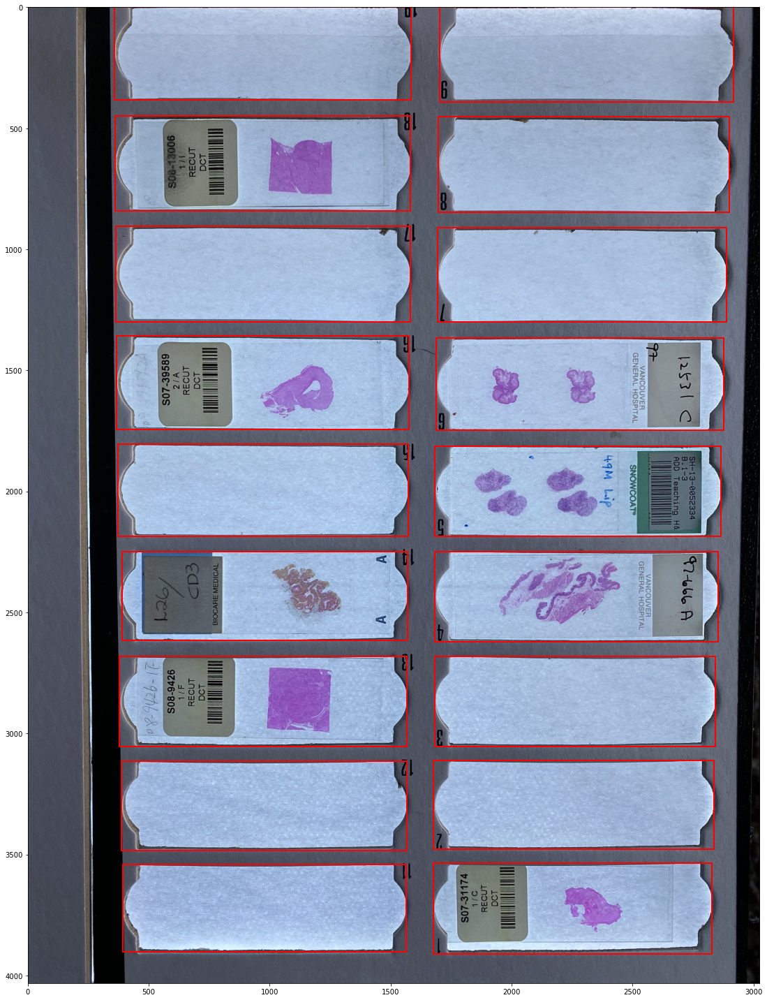

In [57]:
fig, ax = plt.subplots(figsize=(20 , 20))
ax.imshow(cropped_img)

for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 75000:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        rect = mpatches.Rectangle((minc, minr), maxc - minc, maxr - minr,
                                  fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)

# ax.set_axis_off()
plt.tight_layout()
plt.show()

In [58]:
# Save only regions of interest
for region in regionprops(label_image):
    pass

Parsing slide 1 ...
Parsing slide 2 ...
Parsing slide 3 ...
Parsing slide 4 ...
Parsing slide 5 ...
Parsing slide 6 ...
Parsing slide 7 ...
Parsing slide 8 ...
Parsing slide 9 ...
Parsing slide 10 ...
Parsing slide 11 ...
Parsing slide 12 ...
Parsing slide 13 ...
Parsing slide 14 ...
Parsing slide 15 ...
Parsing slide 16 ...
Parsing slide 17 ...
Parsing slide 18 ...


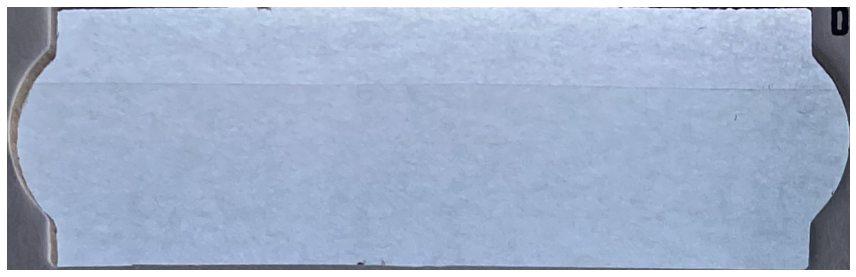

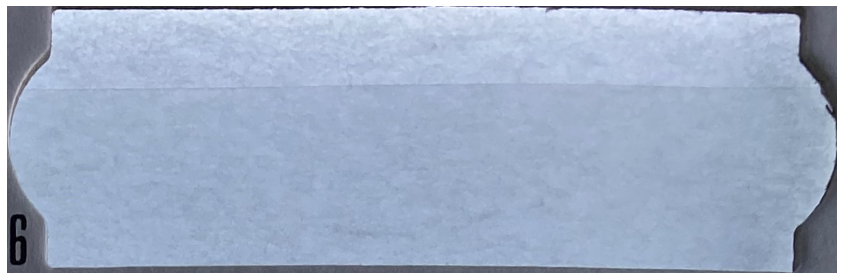

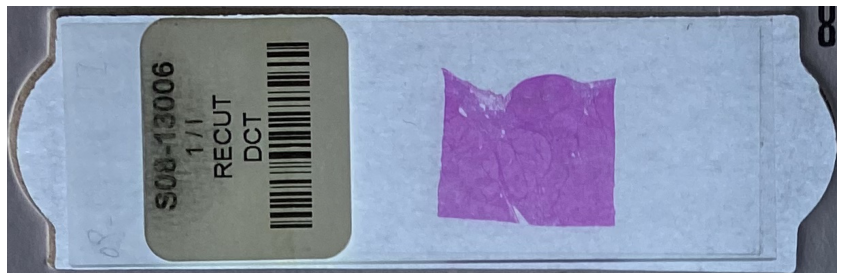

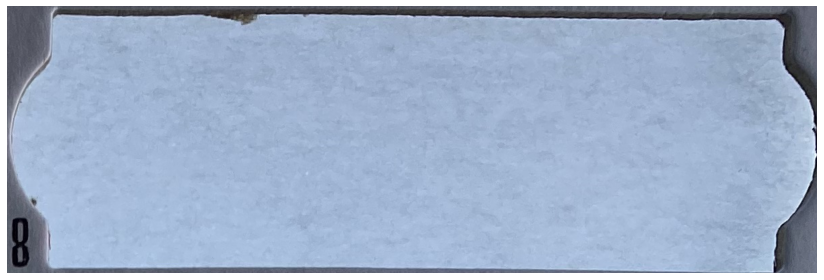

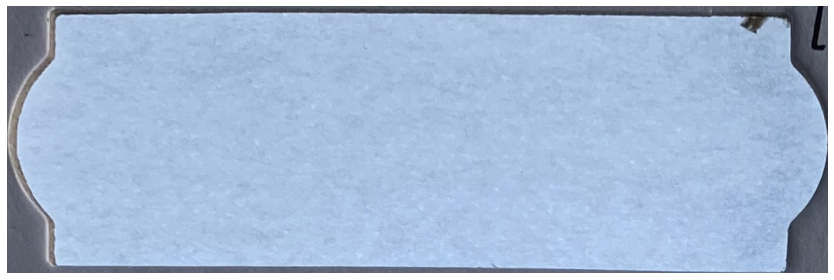

...

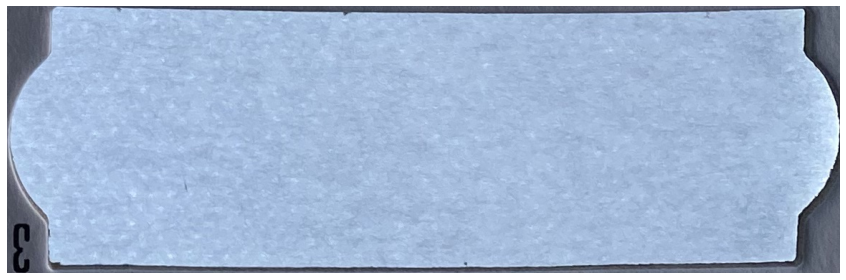

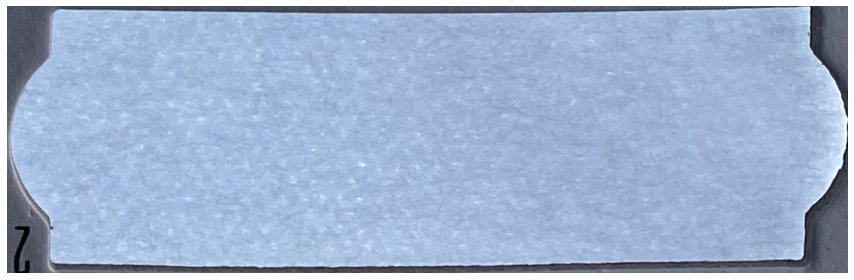

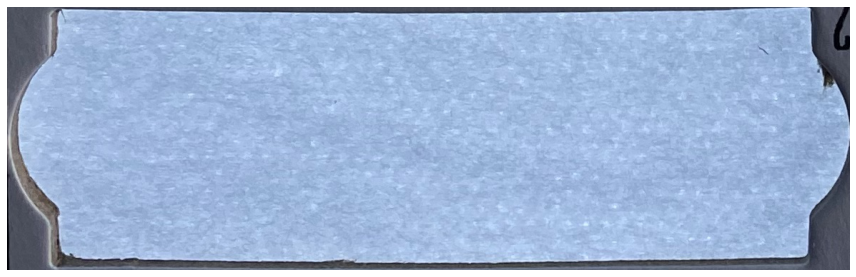

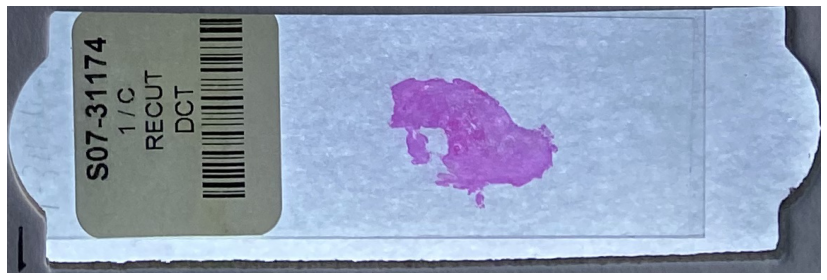

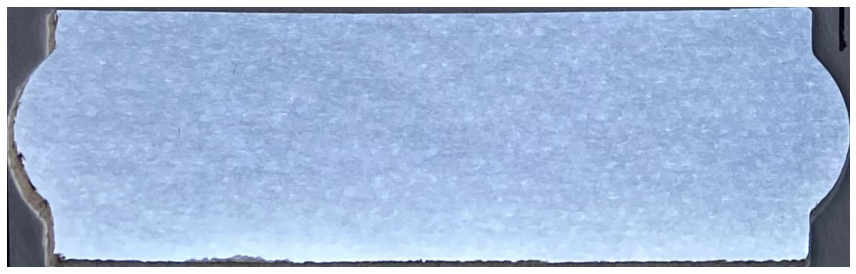

In [63]:
counter = 0

for region in regionprops(label_image):
    # take regions with large enough areas
    if region.area >= 75000:
        # draw rectangle around segmented coins
        minr, minc, maxr, maxc = region.bbox
        fig, ax = plt.subplots(figsize=(12, 4))
        plt.imshow(cropped_img[minr:maxr,minc:maxc])
        ax.set_axis_off()
        plt.tight_layout()
        # plt.show()
        fig.savefig(f'outputs/output{counter}.png')
        print(f'Parsing slide {counter + 1} ...')
        counter += 1

In [61]:
print(f'Parser identified {counter} slides')

Parser identified 18 slides
